# LightGBM model on migration

In [1]:
import copy
import pandas as pd
import pyreadr
import re
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import shap
import lightgbm as lgb
import optuna

from matplotlib.gridspec import GridSpecFromSubplotSpec
from matplotlib.colors import ListedColormap


from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

## Prepare data and test with initial model

In [2]:
full_data = pd.read_csv("data/tft_input.csv", index_col=0)
full_data

,"Average age, both sexes_arr",Demographic dependency ratio_arr,Economic dependency ratio_arr,"Land area, km²_arr",Population density_arr,"Share of Finnish speakers, %_arr","Share of foreign citizens, %_arr","Share of persons aged under 15, %_arr","Share of persons belonging to other religious groups, %_arr","Share of persons belonging to the Evangelical Lutheran Church, %_arr",...,"Share of persons in outer urban area, %_arr","Share of persons in peri-urban area, %_arr","Share of persons in rural areas close to urban areas, %_arr","Share of persons in rural areas, %_arr","Share of persons in rural heartland areas, %_arr","Share of persons in sparsely populated rural areas, %_arr","Share of persons living in the area of birth, %_arr",year,net_migration,municipality
0,38.6,52.2,130.7,2.466986,54.8,99.4,0.4,18.5,1.3,88.7,...,0.0,2.2,45.4,96.3,1.5,0.0,48.3,1990,0.005608,Akaa
1,38.8,52.7,152.3,2.466986,54.9,99.4,0.5,18.5,1.7,88.5,...,0.0,2.3,45.7,96.3,1.5,0.0,48.4,1991,0.002920,Akaa
2,38.8,53.4,171.6,2.466986,55.3,99.4,0.5,18.8,1.7,88.1,...,0.0,2.4,45.3,96.2,1.4,0.0,48.8,1992,0.005123,Akaa
3,39.1,53.8,192.3,2.466853,55.1,99.3,0.6,18.6,1.8,87.5,...,0.0,2.5,45.4,96.3,1.5,0.0,48.9,1993,-0.003593,Akaa
4,39.3,55.2,183.2,2.466853,54.7,99.3,0.6,18.9,1.8,87.1,...,0.0,2.6,45.0,96.3,1.5,0.0,48.9,1994,-0.009602,Akaa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3021,46.0,75.1,186.0,2.946732,21.2,98.1,1.3,15.9,3.5,72.5,...,0.0,0.0,0.4,99.2,43.4,10.3,47.4,2019,-0.004157,Äänekoski
3022,46.5,75.9,190.7,2.946737,21.0,98.0,1.4,15.2,3.5,71.6,...,0.0,0.0,0.4,99.6,43.9,10.3,47.0,2020,-0.010335,Äänekoski
3023,46.9,76.9,174.2,2.946757,20.7,98.0,1.4,14.9,3.5,70.9,...,0.0,0.0,0.4,99.6,44.1,10.3,46.4,2021,-0.007916,Äänekoski
3024,47.2,77.9,168.1,2.946752,20.5,98.0,1.3,14.6,3.3,70.2,...,0.0,0.0,0.4,99.1,43.7,10.2,46.2,2022,-0.010210,Äänekoski


In [3]:
full_data["year"] = full_data["year"].astype("category")
df = copy.deepcopy(full_data)
# lightgbm doesn't like special symbols
df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '_', x))

In [4]:
# Prepare data for modeling
X = df.drop(columns=["year", "net_migration", "municipality"])
y = df["net_migration"]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit LightGBM model
model = lgb.LGBMRegressor(random_state=42)
# model.fit(X_train, y_train, categorical_feature=['Sex'])
model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4269
[LightGBM] [Info] Number of data points in the train set: 2420, number of used features: 20
[LightGBM] [Info] Start training from score -0.001641


LGBMRegressor(random_state=42)

In [5]:
y_pred = model.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.5f}")
print(f"MAE: {mae:.5f}")
print(f"R²: {r2:.3f}")

RMSE: 0.00344
MAE: 0.00264
R²: 0.768


In [6]:
np.max(y_test) - np.min(y_test)

0.048533836629607405

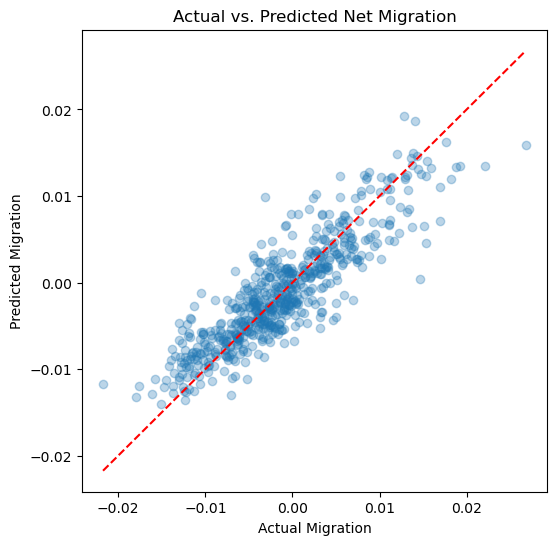

In [7]:
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Migration')
plt.ylabel('Predicted Migration')
plt.title('Actual vs. Predicted Net Migration')
plt.show()

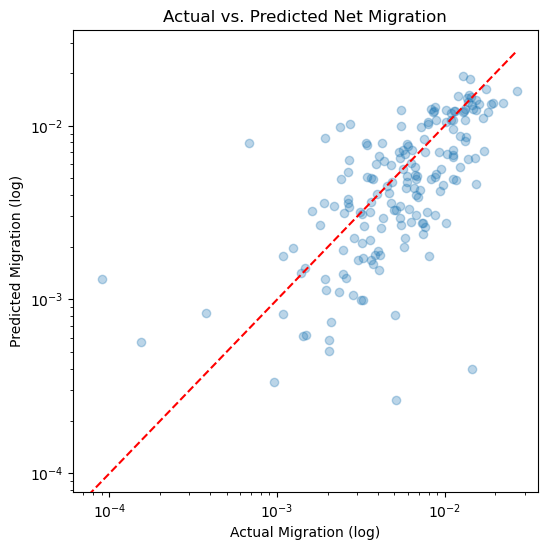

In [8]:
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Actual Migration (log)')
plt.ylabel('Predicted Migration (log)')
plt.title('Actual vs. Predicted Net Migration')
plt.show()

## Optimize with optuna

In [9]:
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_train, X_valid, y_train, y_valid = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=42
)

In [10]:
categorical_features = []


In [11]:
def objective(trial):
    param = {
        # 'objective': 'poisson',  # not stable
        'objective': 'regression', 
        'metric': 'rmse',
        'boosting_type': 'gbdt',
        'verbosity': -1,
        'random_state': 42,
        'learning_rate': trial.suggest_float('learning_rate', 0.2, 0.4),
        'num_leaves': trial.suggest_int('num_leaves', 100, 150),
        'max_depth': trial.suggest_int('max_depth', 10, 20),
        'min_child_samples': trial.suggest_int('min_child_samples', 15, 60),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 1.0),
    }
    
    model = lgb.LGBMRegressor(**param)
    model.fit(
        X_train, y_train,
        eval_set=[(X_valid, y_valid)],
        eval_metric='rmse',
        categorical_feature=categorical_features,
        # early_stopping_rounds=30,
        # verbose=False
    )
    preds = model.predict(X_valid)
    rmse = np.sqrt(mean_squared_error(y_valid, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=200)

print("Best RMSE on validation set: ", study.best_value)
print("Best hyperparameters: ", study.best_params)

[I 2025-05-06 17:33:44,058] A new study created in memory with name: no-name-6d11114a-0cd7-4c7b-9454-7f2a1e4396d6
[I 2025-05-06 17:33:44,071] Trial 0 finished with value: 0.004621257812194135 and parameters: {'learning_rate': 0.38035754693840945, 'num_leaves': 138, 'max_depth': 11, 'min_child_samples': 23, 'subsample': 0.5773115945803298, 'colsample_bytree': 0.8096777126305282, 'reg_alpha': 0.6106029705852584, 'reg_lambda': 0.7580303791336379}. Best is trial 0 with value: 0.004621257812194135.
[I 2025-05-06 17:33:44,084] Trial 1 finished with value: 0.0044594433364928835 and parameters: {'learning_rate': 0.3803454357601771, 'num_leaves': 139, 'max_depth': 18, 'min_child_samples': 35, 'subsample': 0.7237069820981517, 'colsample_bytree': 0.7392138423937475, 'reg_alpha': 0.4214636959032272, 'reg_lambda': 0.40027245300902936}. Best is trial 1 with value: 0.0044594433364928835.
[I 2025-05-06 17:33:44,139] Trial 2 finished with value: 0.0036648518437906287 and parameters: {'learning_rate': 0

Best RMSE on validation set:  0.003481992470317019
Best hyperparameters:  {'learning_rate': 0.21869286699934634, 'num_leaves': 107, 'max_depth': 13, 'min_child_samples': 32, 'subsample': 0.725619522811487, 'colsample_bytree': 0.6645067529008442, 'reg_alpha': 0.019088215737992457, 'reg_lambda': 0.2944512434504364}


In [12]:
best_params = dict({'seed': 42}, **study.best_params)
best_model = lgb.train(best_params, 
                      lgb.Dataset(X_train, y_train),
                      valid_sets=[lgb.Dataset(X_valid, y_valid)])

preds = best_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, preds))

print(f'RMSE: {rmse}')
print(f'RMSE-% of truth: {rmse / np.mean(y_test) * 100}')
print(f'RMSE-% of max-min truth: {rmse / (np.max(y_test) - np.min(y_test)) * 100}')

RMSE: 0.003634991886417916
RMSE-% of truth: -265.82430111899333
RMSE-% of max-min truth: 7.489603416599541


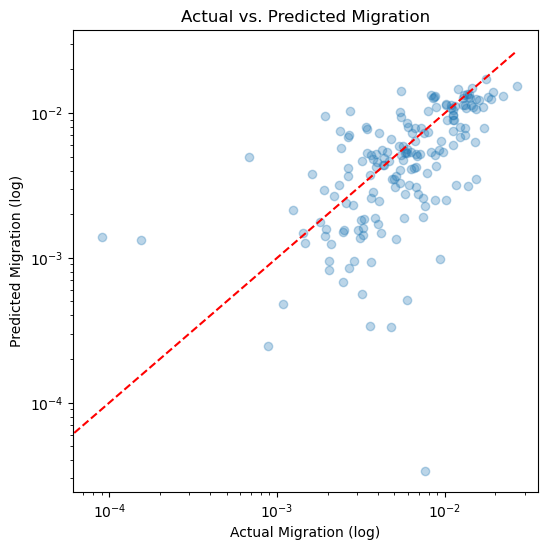

In [13]:
plt.figure(figsize=(6,6))
plt.scatter(y_test, preds, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Actual Migration (log)')
plt.ylabel('Predicted Migration (log)')
plt.title('Actual vs. Predicted Migration')
plt.show()

In [14]:
from plotly.io import show
fig = optuna.visualization.plot_slice(study)
show(fig)

In [15]:
feature_names = df.drop(columns=["year", "net_migration", "municipality"]).columns
importance = pd.Series(best_model.feature_importance(importance_type='gain'), 
                       index=feature_names)

importance

Average_age_both_sexes_arr                                            0.009155
Demographic_dependency_ratio_arr                                      0.004320
Economic_dependency_ratio_arr                                         0.055737
Land_area_km__arr                                                     0.003809
Population_density_arr                                                0.001676
Share_of_Finnish_speakers__arr                                        0.006178
Share_of_foreign_citizens__arr                                        0.002541
Share_of_persons_aged_under_15__arr                                   0.009646
Share_of_persons_belonging_to_other_religious_groups__arr             0.001299
Share_of_persons_belonging_to_the_Evangelical_Lutheran_Church__arr    0.004024
Share_of_persons_born_in_the_area_of_residence__arr                   0.058206
Share_of_persons_in_inner_urban_area__arr                             0.002913
Share_of_persons_in_local_centres_in_rural_areas__ar

## SHAP on train

In [16]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer(X_train)

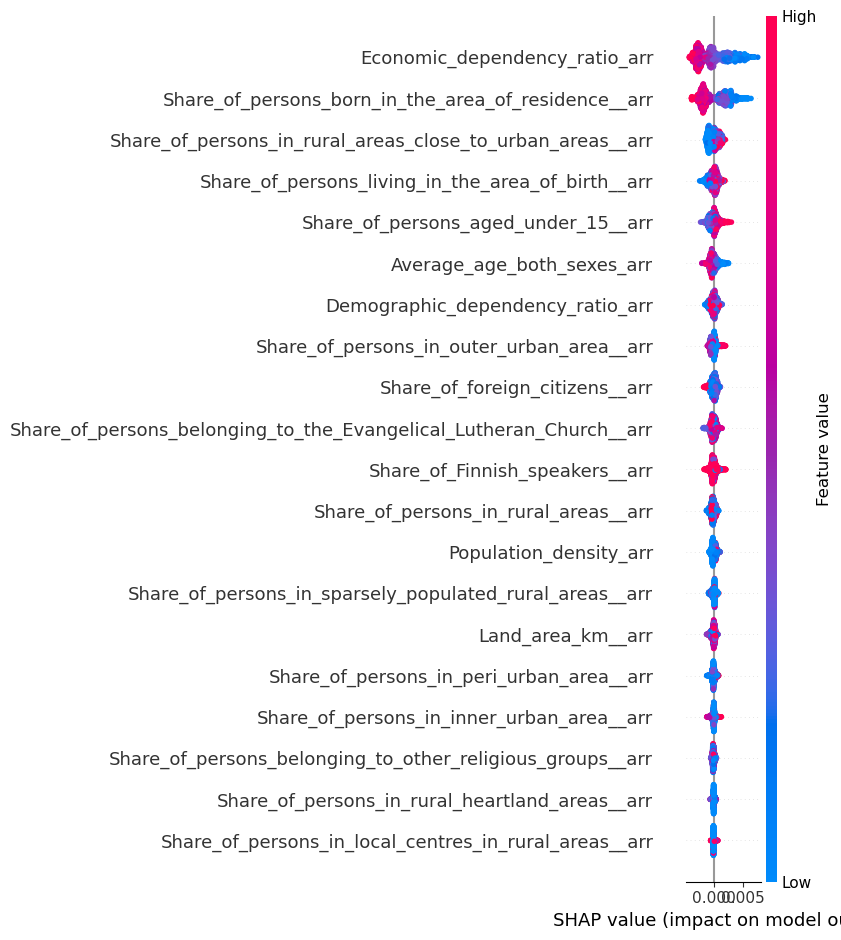

In [17]:
# shap_values.feature_names = feature_names
# fig, ax = plt.subplots(1, 1, figsize=(40, 12))
shap.summary_plot(shap_values, X_train, feature_names=feature_names, show=False)
plt.savefig("images/lgb-shap-train-importance.png")
plt.show()

### Color by target municipality

In [18]:
largest = set(df.groupby(["municipality"])["net_migration"].sum().sort_values()[-10:].keys())
print(largest)

{'Lieto', 'Kaarina', 'Naantali', 'Nurmijärvi', 'Lempäälä', 'Mäntsälä', 'Pirkkala', 'Kirkkonummi', 'Tuusula', 'Sipoo'}


In [19]:
df.groupby(["municipality"])["net_migration"].sum().sort_values()[-10:]

municipality
Mäntsälä       0.215930
Tuusula        0.231157
Kirkkonummi    0.231388
Naantali       0.239874
Lieto          0.263044
Kaarina        0.268657
Nurmijärvi     0.275619
Lempäälä       0.334540
Pirkkala       0.347997
Sipoo          0.415789
Name: net_migration, dtype: float64

In [20]:
palette = sns.color_palette("husl", n_colors=len(largest))
palette.append([0.8, 0.8, 0.8, 1.0])

In [21]:
_idx = X_train.index

/tmp/ipykernel_213614/2002590861.py:65: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



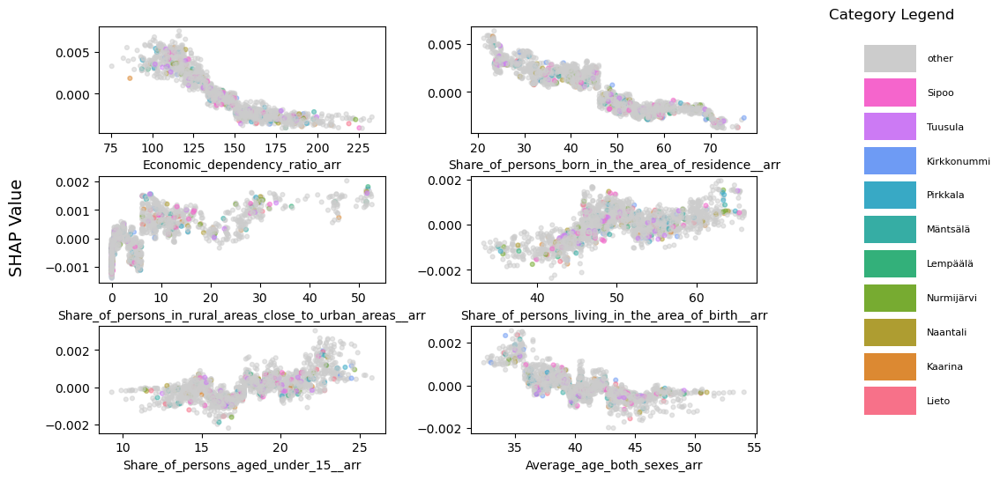

In [22]:
fig = plt.figure(figsize=(12, 6))
gs = fig.add_gridspec(1, 2, width_ratios=[6, 0.5], wspace=0.3)

# Create a 3x2 GridSpec inside the left subplot area
left_gs = GridSpecFromSubplotSpec(3, 2, subplot_spec=gs[0], hspace=0.4, wspace=0.3)

axes = []
for i in range(6):
    row, col = divmod(i, 2)
    ax = fig.add_subplot(left_gs[row, col])
    axes.append(ax)

# Data setup

# Get feature importance based on mean absolute SHAP values
feature_importance = np.abs(shap_values.values).mean(axis=0)
top_features = np.argsort(feature_importance)[-6:][::-1]  # Indices of 6 most important features
orig_data = shap_values.data


# Colors 
palette = sns.color_palette("husl", n_colors=len(largest))
palette.append([0.8, 0.8, 0.8, 1.0])
cmap = ListedColormap(palette)
unique_cats = df['municipality'].unique()
# color_indices = pd.factorize(largest)[0]
idx_map = {v:i for (i, v) in enumerate(list(largest))}

color_indices = []
for a in df.loc[df.index.isin(_idx), 'municipality']:
    if a in largest:
        color_indices.append(idx_map[a])
    else:
        color_indices.append(len(largest))

colors = cmap(color_indices)

# Plot scatter plots on these axes
for i, feature_index in enumerate(top_features):
    ax = axes[i]
    _x = orig_data[:, feature_index]
    _y = shap_values[:, feature_index].values
    ax.scatter(_x, _y, alpha=0.5, s=12, zorder=3, color=colors)
    ax.set_xlabel(f'{feature_names[feature_index]}')
    ax.set_ylabel('')

# Shared y-label for SHAP values
fig.text(0.04, 0.5, 'SHAP Value', va='center', rotation='vertical', fontsize=14)

# Right subplot for legend
ax_legend = fig.add_subplot(gs[1])
idx_map_rev = {i: m for m, i in idx_map.items()}

for i, color in enumerate(palette):
    try:
        label = idx_map_rev[i]
    except KeyError:
        label = "other"
    ax_legend.barh(i, 0.5, color=color)
    ax_legend.text(0.6, i, label, va='center', size=8)

ax_legend.set_title("Category Legend")
ax_legend.axis('off')

plt.tight_layout(rect=[0.05, 0, 1, 1])
plt.savefig("images/lgb-shap-train-panel.png")
plt.show()
